In [3]:
#MAKING CSV FILE WITHOUT ZF TILES
import pandas as pd

# Load the CSV file
input_file = "transfac_tiles_250207.csv"
output_file = "nonzf_transfac_tiles.csv"

# Read the CSV file
df = pd.read_csv(input_file)

# Filter rows where the 'zf' column contains 'T'
filtered_df = df[df['zf'] == 'F']

# Save the filtered data to a new CSV file
filtered_df.to_csv(output_file, index=False)

print(f"Filtered data saved to {output_file}")


Filtered data saved to nonzf_transfac_tiles.csv


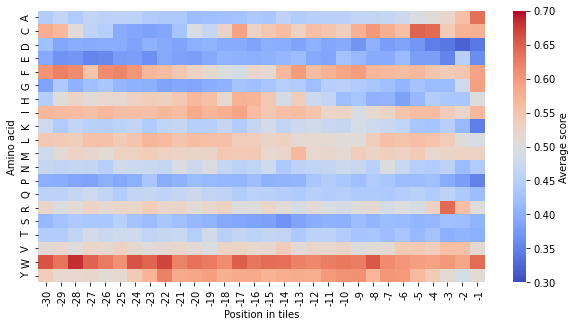

In [11]:
#HEATMAP (Fig. 4A and 4B)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.transforms as mtransforms

# Load the data
df = pd.read_csv('transfac_tiles_250207.csv') #transfac_tiles_250207.csv for all tiles, nonzf_transfac_tiles.csv for non-zf tiles

# Filter out rows with sequences containing '*' or with length different from 30
filtered_out_df = df[(df['aa'].str.contains('\*')) | (df['aa'].str.len() != 30)]
filtered_out_df.to_csv('filtered_out_sequences.csv', index=False)

# Continue with only valid sequences
df = df[~(df['aa'].str.contains('\*')) & (df['aa'].str.len() == 30)]

aa_list = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

# Initialize dictionaries for each amino acid at each position
aa_dict = {pos: {aa: {'sum': 0, 'sum_square': 0, 'count': 0} for aa in aa_list} for pos in range(30)}

# Analyze the data
for _, row in df.iterrows():
    sequence = row['aa']
    score = row['degron_score']

    if pd.notna(score): 
        for pos, aa in enumerate(sequence):
            if aa in aa_dict[pos]:  
                aa_dict[pos][aa]['sum'] += score
                aa_dict[pos][aa]['sum_square'] += score**2
                aa_dict[pos][aa]['count'] += 1


# Compute averages, counts, and standard deviations
averages = {pos: {aa: aa_data['sum']/aa_data['count'] if aa_data['count'] != 0 else 0 for aa, aa_data in pos_data.items()} for pos, pos_data in aa_dict.items()}
counts = {pos: {aa: aa_data['count'] for aa, aa_data in pos_data.items()} for pos, pos_data in aa_dict.items()}
std_devs = {pos: {aa: np.sqrt((aa_data['sum_square'] - (aa_data['sum']**2)/aa_data['count'])/aa_data['count']) if aa_data['count'] > 1 else 0 for aa, aa_data in pos_data.items()} for pos, pos_data in aa_dict.items()}

# Convert to DataFrame
averages_df = pd.DataFrame(averages)
counts_df = pd.DataFrame(counts)
std_devs_df = pd.DataFrame(std_devs)

# Change column names to range from -30 to -1
new_columns = range(-30, 0)
averages_df.columns = counts_df.columns = std_devs_df.columns = new_columns

# Plot heatmap
plt.figure(figsize=(10, 5))
ax = sns.heatmap(averages_df, cmap="coolwarm", vmin=0.3, vmax=0.7, cbar_kws={'label': 'Average score'})
plt.ylabel('Amino acid')
plt.xlabel('Position in tiles')

# Adjust the position of the x-axis labels
ax.set_xticks(np.arange(0.5, len(new_columns), 1)) 
ax.set_xticklabels(new_columns, ha='left') 

# Adjust label positions
for label in ax.get_xticklabels():
    
    offset = mtransforms.ScaledTranslation(-0.04, 0, plt.gcf().dpi_scale_trans)
    label.set_transform(label.get_transform() + offset)

# Save the figure
plt.savefig("tf_heatmap4.pdf", format='pdf')
plt.show()

# Save DataFrames to csv
averages_df.to_csv('tf_averages_heatmap4.csv', index=True)
counts_df.to_csv('tf_counts_heatmap4.csv', index=True)
std_devs_df.to_csv('tf_std_devs_heatmap4.csv', index=True)

In [18]:
#C-degron effects (significance) (For Fig. S6A and S6B)
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Load data
data = pd.read_csv('nonzf_transfac_tiles.csv') #transfac_tiles_250207.csv for all tiles, nonzf_transfac_tiles.csv for non-zf tiles
data = data.dropna(subset=['degron_score'])
data = data[data['aa'].astype(str).str.contains(r'\*', regex=True, na=False) == False]
data = data[data['aa'].str.len() == 30]

# Define amino acids and positions
amino_acids = list('ACDEFGHIKLMNPQRSTVWY')
positions = range(30) 

# Initialize results dictionaries
counts = {aa: [0]*30 for aa in amino_acids}
counts_not_pos = {aa: [0]*30 for aa in amino_acids}
average_scores = {aa: [0]*30 for aa in amino_acids}
average_scores_not_pos = {aa: [0]*30 for aa in amino_acids}
sd_scores = {aa: [0]*30 for aa in amino_acids}
sd_scores_not_pos = {aa: [0]*30 for aa in amino_acids}
p_values = {aa: [1]*30 for aa in amino_acids}
significant_results = {aa: [np.nan]*30 for aa in amino_acids}

# Analysis loop
for aa in amino_acids:
    for pos in positions:
        # Filter data
        data_pos = data[data['aa'].apply(lambda seq: seq[pos] == aa and seq.count(aa) == 1)]
        data_not_pos = data[data['aa'].apply(lambda seq: seq[pos] != aa and seq.count(aa) == 1)]

        # Calculate statistics
        counts[aa][pos] = len(data_pos)
        counts_not_pos[aa][pos] = len(data_not_pos)
        
        if not data_pos.empty:
            average_scores[aa][pos] = data_pos['degron_score'].mean()
            sd_scores[aa][pos] = data_pos['degron_score'].std()
        
        if not data_not_pos.empty:
            average_scores_not_pos[aa][pos] = data_not_pos['degron_score'].mean()
            sd_scores_not_pos[aa][pos] = data_not_pos['degron_score'].std()
        
        # Mann-Whitney U Test
        if not data_pos.empty and not data_not_pos.empty:
            _, p_value = mannwhitneyu(data_pos['degron_score'], data_not_pos['degron_score'], alternative='two-sided')
            p_values[aa][pos] = p_value
            # Bonferroni correction: adjust alpha level by the number of tests
            if p_value < (0.05 / 600):
                significant_results[aa][pos] = p_value

# Transform dictionaries into DataFrames and transpose
position_labels = list(range(-30, 0))
df_counts = pd.DataFrame(counts, index=position_labels).transpose()
df_counts_not_pos = pd.DataFrame(counts_not_pos, index=position_labels).transpose()
df_average_scores = pd.DataFrame(average_scores, index=position_labels).transpose()
df_average_scores_not_pos = pd.DataFrame(average_scores_not_pos, index=position_labels).transpose()
df_sd_scores = pd.DataFrame(sd_scores, index=position_labels).transpose()
df_sd_scores_not_pos = pd.DataFrame(sd_scores_not_pos, index=position_labels).transpose()  
df_p_values = pd.DataFrame(p_values, index=position_labels).transpose()
df_significant_results = pd.DataFrame(significant_results, index=position_labels).transpose()

# Save results to CSV

df_average_scores.to_csv('nonzf_tf_average_scores_aa_in_pos.csv')
df_average_scores_not_pos.to_csv('nonzf_tf_average_scores_aa_not_in_pos.csv')
df_significant_results.to_csv('nonzf_tf_significant_results.csv')


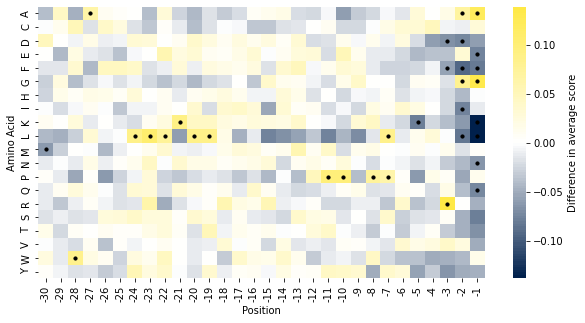

In [19]:
#POSITIONAL EFFECT ANALYSIS HEATMAP (Fig. S6A and S6B)
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Load average scores from CSV files
df_average_scores_in_pos = pd.read_csv('nonzf_tf_average_scores_aa_in_pos.csv', index_col=0)
df_average_scores_not_in_pos = pd.read_csv('nonzf_tf_average_scores_aa_not_in_pos.csv', index_col=0)

# Subtract the two DataFrames
df_difference = df_average_scores_in_pos - df_average_scores_not_in_pos

# Save the difference to a new CSV file
df_difference.to_csv('nonzf_tf_difference_average_scores.csv')

# Load significant results
df_significant_results = pd.read_csv('nonzf_tf_significant_results.csv', index_col=0)

# Create a mask for significant results to use in heatmap
mask = df_significant_results.notna()

# Custom colormap
colors = ["#00204C", "white", "#FFE945"]  
n_bins = 100  
cmap_name = 'custom_cividis_white'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plot heatmap of the differences
plt.figure(figsize=(10, 5))
sns.heatmap(df_difference, cmap=custom_cmap, center=0,
            cbar_kws={'label': 'Difference in average score'},
            annot=False) 

# Overlay dots on significant cells
for y in range(df_difference.shape[0]):
    for x in range(df_difference.shape[1]):
        if mask.iloc[y, x]:  
            plt.scatter(x + 0.5, y + 0.5, color='black', s=10)  

plt.xlabel('Position')
plt.ylabel('Amino Acid')
plt.xticks(ticks=np.arange(0.5, len(df_difference.columns), 1), labels=df_difference.columns, rotation=90)
plt.yticks(ticks=np.arange(0.5, len(df_difference.index), 1), labels=df_difference.index)
plt.savefig('nonzf_tf_difference_in_vs_not_in_heatmap_v3.pdf', format='pdf')
plt.show()
plt.close()

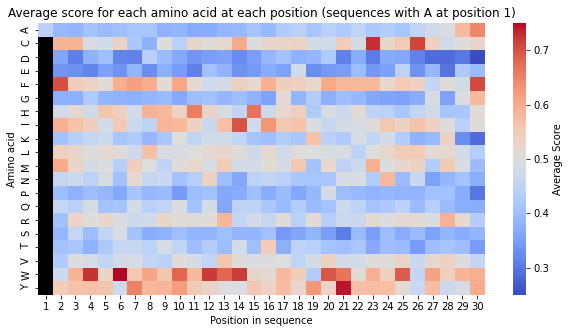

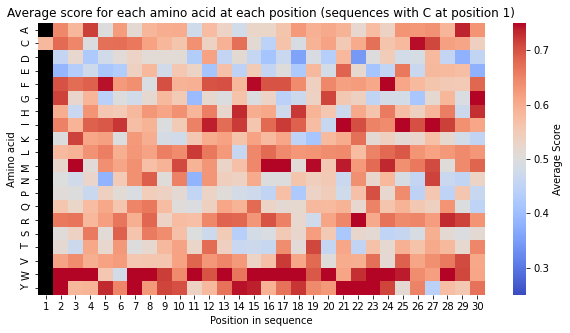

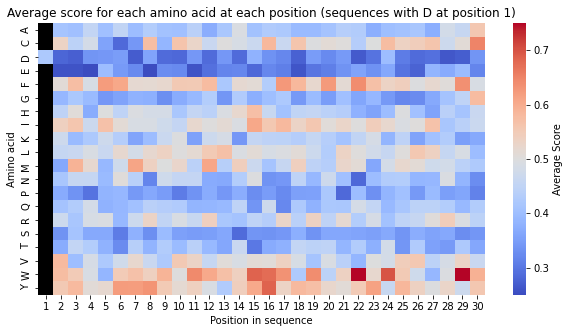

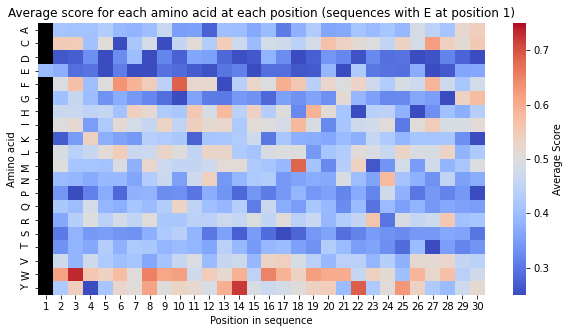

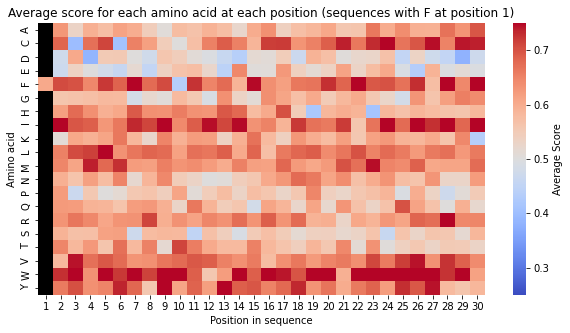

...

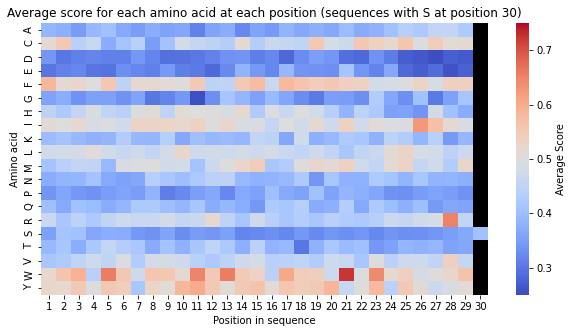

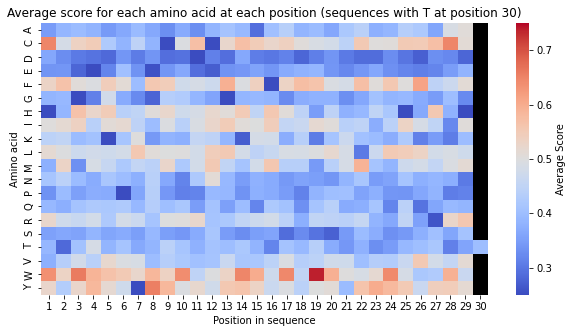

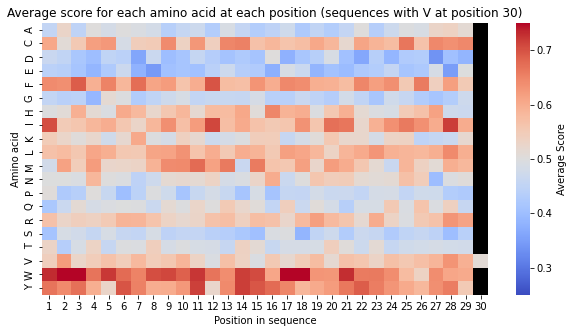

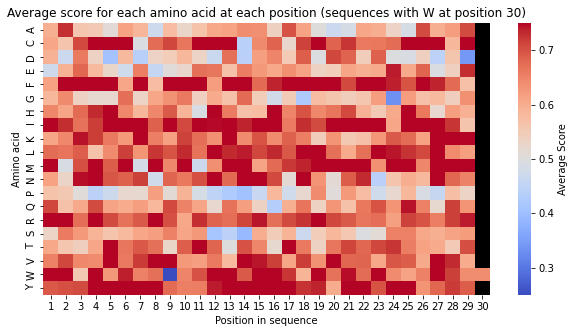

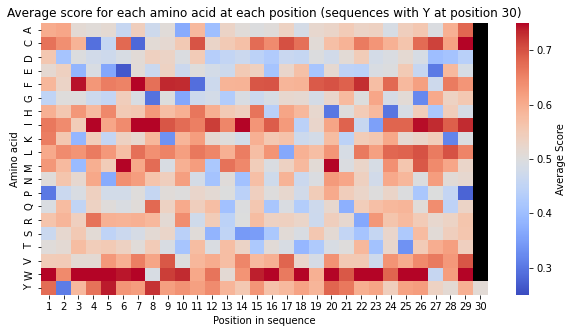

In [22]:
#FIXED AA POSITION (Fig. S7)
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv('transfac_tiles_250207.csv')
df = df.dropna(subset=['degron_score'])

aa_list = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

for pos in range(1, 31):  # Loop for each position
   
    directory = f'tf_heatmaps_aa_position_{pos}'
    if not os.path.exists(directory):
        os.makedirs(directory)

    for aa in aa_list:  # Loop for each amino acid
        # Filter the sequences that have the current aa at the specified position
        df_filtered = df[df['aa'].str.slice(pos-1, pos) == aa]  

        # Initialize dictionaries for each amino acid at each position
        aa_dict = {p: {a: {'sum': 0, 'scores': [], 'count': 0} for a in aa_list} for p in range(30)}

        # Analyze the data
        for _, row in df_filtered.iterrows():
            sequence = row['aa']
            score = row['degron_score']

            for p, a in enumerate(sequence):
                if a in aa_dict[p]: 
                    aa_dict[p][a]['sum'] += score
                    aa_dict[p][a]['scores'].append(score)
                    aa_dict[p][a]['count'] += 1

        # Compute averages, counts, and standard deviations
        averages = {p: {a: aa_data['sum']/aa_data['count'] if aa_data['count'] != 0 else 0 for a, aa_data in p_data.items()} for p, p_data in aa_dict.items()}
        counts = {p: {a: aa_data['count'] for a, aa_data in p_data.items()} for p, p_data in aa_dict.items()}
        std_devs = {p: {a: np.std(aa_data['scores']) if aa_data['count'] != 0 else 0 for a, aa_data in p_data.items()} for p, p_data in aa_dict.items()}

        # Convert to DataFrames
        averages_df = pd.DataFrame(averages)
        counts_df = pd.DataFrame(counts)
        std_devs_df = pd.DataFrame(std_devs)

        # Change column names
        averages_df.columns = range(1, 31)
        counts_df.columns = range(1, 31)
        std_devs_df.columns = range(1, 31)

        # Set the values for the fixed position (pos) to NaN for all amino acids except the fixed one
        for a in aa_list:
            if a != aa:  
                averages_df.loc[a, pos] = np.nan

        # Plot heatmap with NaN values appearing as black
        plt.figure(figsize=(10, 5))
        sns.heatmap(averages_df, cmap="coolwarm", vmin=0.25, vmax=0.75, mask=averages_df.isna(), cbar_kws={'label': 'Average Score'})

        # Set missing values to black using facecolor
        plt.gca().set_facecolor('black')

        plt.ylabel('Amino acid')
        plt.xlabel('Position in sequence')
        plt.title(f'Average score for each amino acid at each position (sequences with {aa} at position {pos})')

        # Save the figure
        plt.savefig(os.path.join(directory, f"tf_heatmap_{aa}_position_{pos}.pdf"), format='pdf')
        plt.show()

        # Save DataFrames to CSV files
        averages_df.to_csv(os.path.join(directory, f'tf_averages_heatmap_{aa}_position_{pos}.csv'), index=True)
        counts_df.to_csv(os.path.join(directory, f'tf_counts_heatmap_{aa}_position_{pos}.csv'), index=True)
        std_devs_df.to_csv(os.path.join(directory, f'tf_std_devs_heatmap_{aa}_position_{pos}.csv'), index=True)
